## Build makemore Part 1: Bigram character-level language model

build explicit probability dataset for lang model, and then use neural network to approx this dataset for lang model

NN is more scalable because if you want to keep the last 10 characters, no longer easily expressible as a table

[Full loop](#full-training-loop)

## Part A: Sampling naively

In [1]:
#read separates it into new lines
# splitlines splits between each word, to create a list of words (names)
words=open('names.txt', 'r').read().splitlines()

#### Building dataset for Bigram model
Bigram only looks at the prior character. builds a dataset of pairs (first charac, second charac) from text dataset

you also store this frequency of pairs data somewhere. we will store it in a torch array

note that later on the start `<S>` token and end `<E>` token will be replaced by `.`

In [2]:
#note zip will break the string into characters and zip together
for ch1, ch2 in zip('testing','1234'):
    print(ch1,ch2)

t 1
e 2
s 3
t 4


In [3]:
#mapping from alphabets/characters to integers, ease of use in pytorch
#convert to pytorch array where values store the frequency
import torch
import numpy as np
#global seed
torch.manual_seed(42)
torch.cuda.manual_seed_all(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(42)
#create a separate generator and set the seed
g=torch.Generator()
g.manual_seed(42)


#26 alphabets and <S> and <E> form 28 columns
#this will store all our frequencies
N=torch.zeros((28,28), dtype=torch.int32)

#map characters(alphabets) to integers
chars=sorted(list(set(''.join(words))))

ctoi= {c:i for i,c in enumerate(chars)}
ctoi['<S>']=26
ctoi['<E>']=27

#loop over each word
for w in words:
    #create the first charac and ending charac for every word
    # need starting charac so we know whats the first alphabet character
    chs=['<S>'] + list(w) + ['<E>']
    #loop over 1 and 2nd charac, 2nd and 3rd charac, 3rd and 4th charac etc
    for ch1, ch2 in zip(chs, chs[1:]):
        #get integer representations of these characters
        ix1=ctoi[ch1]
        ix2=ctoi[ch2]
        #increase count for this mapping by one
        #note that this means row information stores the first character; column stores the second character
        N[ix1,ix2]+=1

(np.float64(-0.5), np.float64(27.5), np.float64(27.5), np.float64(-0.5))

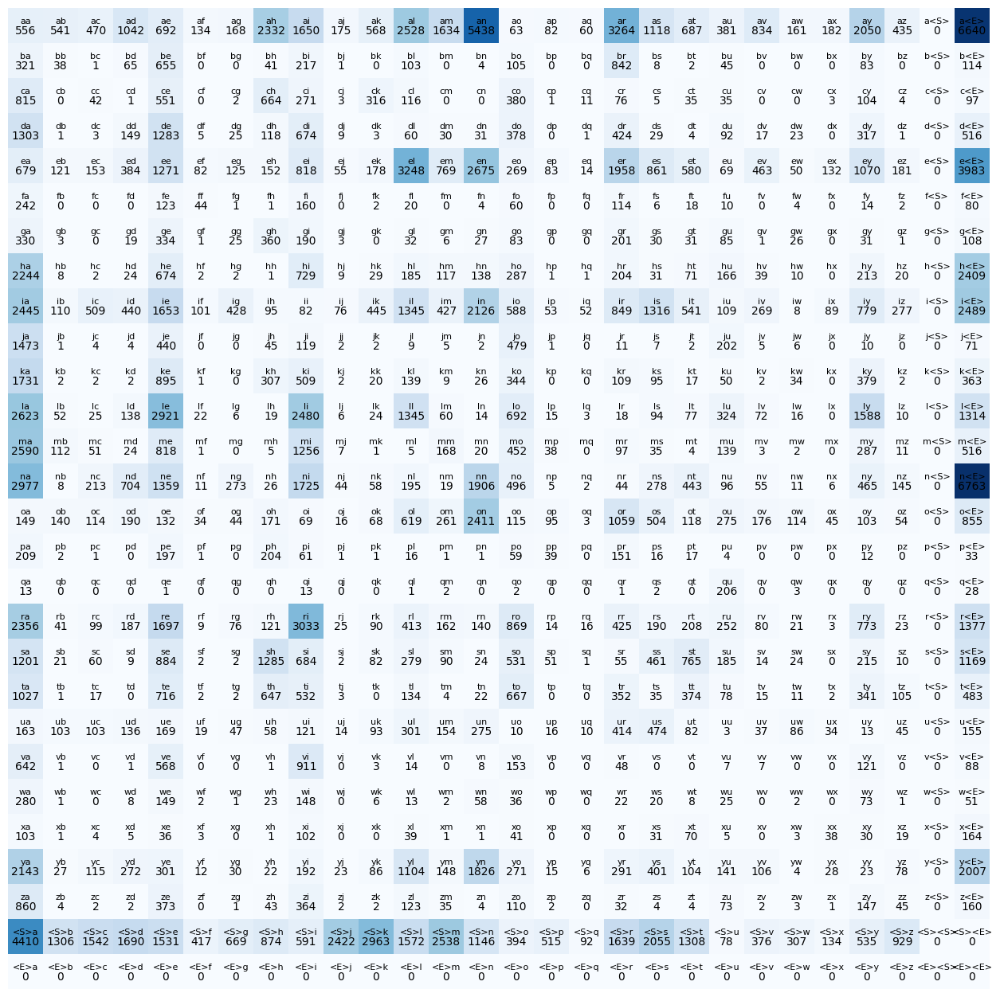

In [4]:
#visualize N
import matplotlib.pyplot as plt
%matplotlib inline

#invert {charac:integer}, map integer to charac
itoc={i:c for c,i in ctoi.items()}

#this is needed to create a big enough figure
plt.figure(figsize=(16,16))
#colour data
plt.imshow(N,cmap='Blues')
for i in range(28):
    for j in range(28):
        freq=itoc[i]+itoc[j]
        # When plotting
        # The horizontal axis (x-axis) corresponds to columns
        # The vertical axis (y-axis) corresponds to rows
        plt.text(j,i,freq,ha='center',va='bottom',fontsize=8)
        #need to do .item() if not will still get a tensor object back
        plt.text(j,i,N[i,j].item(),ha='center',va='top')
#dont show axis values
plt.axis('off')

replace both `<S>` and `<E>` by `.`

In [5]:
N=torch.zeros((27,27), dtype=torch.int32)

#map characters(alphabets) to integers
chars=sorted(list(set(''.join(words))))

#i+1 so indexing actually starts from 1, we reserve position 0 for '.' charac
ctoi= {c:i+1 for i,c in enumerate(chars)}
ctoi['.']=0

#loop over each word
for w in words:
    #create the first charac and ending charac for every word
    # need starting charac so we know whats the first alphabet character
    chs=['.'] + list(w) + ['.']
    #loop over 1 and 2nd charac, 2nd and 3rd charac, 3rd and 4th charac etc
    for ch1, ch2 in zip(chs, chs[1:]):
        #get integer representations of these characters
        ix1=ctoi[ch1]
        ix2=ctoi[ch2]
        #increase count for this mapping by one
        #note that this means row information stores the first character; column stores the second character
        N[ix1,ix2]+=1

(np.float64(-0.5), np.float64(26.5), np.float64(26.5), np.float64(-0.5))

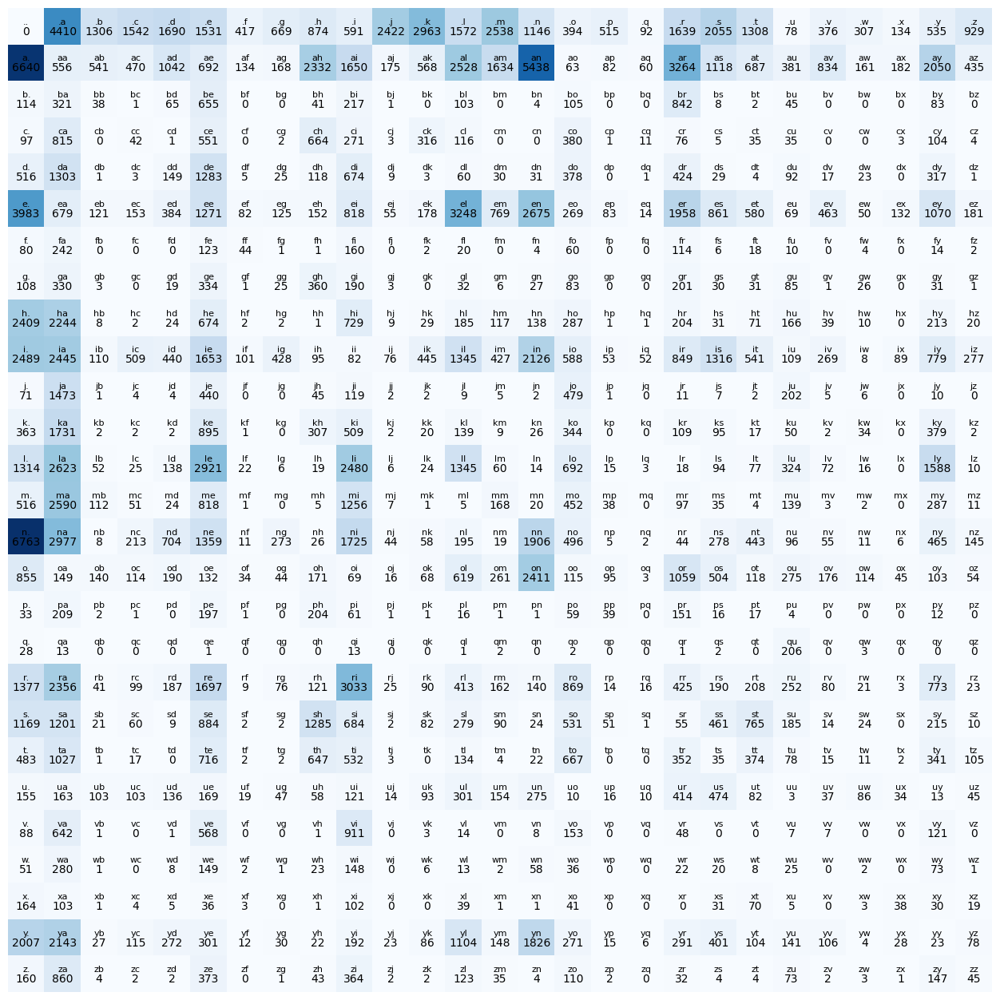

In [6]:

#invert {charac:integer}, map integer to charac
itoc={i:c for c,i in ctoi.items()}

#this is needed to create a big enough figure
plt.figure(figsize=(16,16))
#colour data
plt.imshow(N,cmap='Blues')
for i in range(27):
    for j in range(27):
        freq=itoc[i]+itoc[j]
        # When plotting
        # The horizontal axis (x-axis) corresponds to columns
        # The vertical axis (y-axis) corresponds to rows
        plt.text(j,i,freq,ha='center',va='bottom',fontsize=8)
        #need to do .item() if not will still get a tensor object back
        plt.text(j,i,N[i,j].item(),ha='center',va='top')
#dont show axis values
plt.axis('off')

### Sampling from this dataset as probability distributions

sampling naively from this model (prob dist)

note that each row represents the probability distribution, that given the first charac, what is probability of second charac?

we also vectorize this current process: normalize by rows, tensor broadcasting

#### Pytorch broadcasting rules
- Each tensor has at least one dimension.
- When iterating over the dimension sizes, starting at the trailing dimension, compare the 2 dimensions from each tensor pair by pair
    - both of them have the same size, or one of them must be 1, or one of them does not exist.

```python
# can line up trailing dimensions
>>> x=torch.empty(5,3,4,1)
>>> y=torch.empty(  3,1,1)
# x and y are broadcastable.
# 1st trailing dimension: both have size 1
# 2nd trailing dimension: y has size 1
# 3rd trailing dimension: x size == y size
# 4th trailing dimension: y dimension doesn't exist

# but:
>>> x=torch.empty(5,2,4,1)
>>> y=torch.empty(  3,1,1)
# x and y are not broadcastable, because in the 3rd trailing dimension 2 != 3
```

If two tensors x, y are “broadcastable”, the resulting tensor size is calculated as follows:
- If the number of dimensions of x and y are not equal, *prepend* 1 to the dimensions of the tensor with fewer dimensions to make them equal length.
- Then, for each dimension size, the resulting dimension size is the max of the sizes of x and y along that dimension.

```python
# can line up trailing dimensions to make reading easier
>>> x=torch.empty(5,1,4,1)
>>> y=torch.empty(  3,1,1)
>>> (x+y).size()
torch.Size([5, 3, 4, 1])

In [7]:
#note that the sequence 'jq' has zero frequency, this will cause an infinite nll
# to solve this, we do a fake smoothing by adding a count of 1 to everything, to ensure that there are no sequences with zero frequencies
P=(N+1).float()
#normalize so each row sums to one. normalize horizontally

'''
BE CAREFUL OF BROADCASTING as below
keepdims means it is still a 2D matrix. will become (27,1) since collapse horizontally.
without keepdims, this will become (27,)
note that (27,27) broadcast differently with (27,1) and (27,)!! The latter will broadcast over the first dimension, which is not what we want.
'''
P/=P.sum(dim=1,keepdims=True) #use in place operations if possible so you dont create completely new tensors, doesnt create new memory


#for loop to sample words multiple times'
for sample in range(10):
    #start from '.' token hence first idx 0
    idx=0
    out=[]
    while True:
        #get the row associated with this first charac
        row = P[idx].float()
        '''
        try
        p = torch.ones(27.0)/27.0
        to test a uniform distribution, and see how shit it performs compared to our current bigram model
        you will see consonants followed by consonants which are clearly rubbish
        '''
        #samples from this distribution. replacement=False means it can only sample from that column once. need .item() to extract the number, else it will return a tensor object
        idx = torch.multinomial(row, num_samples=1, replacement=True, generator=g).item()
        #add to current list
        out.append(itoc[idx])
        #have reached the <E> token basically
        if idx==0:
            break
    print(''.join(out))

ya.
syahavilin.
dleekahmangonya.
tryahe.
chen.
ena.
da.
amiiae.
a.
keles.


### Create the loss function, neg log likelihood

to get probability that model predicts "emma"
we take 

$$
P(\text{.emma.}) = P(e|.) \cdot P(m|.e) \cdot P(m|.em) \cdot P(a|.emm) \cdot P(.|.emma)
$$

and we want to maximise this. This is equivalent to minimising

$$
-\log P(\text{.emma.}) = -\log P(e|.) - \log P(m|.e) - \log P(m|.em) - \log P(a|.emm) - \log P(.|.emma)
$$

as log is a purely increasing function. The loss function decreases with better loss so we take the negative log likelihood. We then take the average across examples. Lowest possible value is 0, and the lower the better.

#### A note on autoregressive models and n-gram models.

By repeated application of the product rule of probability, a general distribution over $N$ variables can be written as the product of conditional distributions, and that the form of this decomposition depends on a specific of ordering for the variables. For vector-valued variables, and if we chose an ordering that corresponds to the order of the variables in the sequence, then we can write
$$p(x_1,\ldots,x_N) = \prod_{n=1}^N p(x_n|x_1,\ldots,x_{n-1}).  \tag{11.42}$$
This corresponds to a directed graph in which each node receives a link from every previous node in the sequence. This is known as an autoregressive model.
This representation has complete generality and therefore from a modelling perspective adds no value since it encodes no assumptions. We can constrain the space of models by introducing conditional independence properties by removing links from the graph.
The strongest assumption would be to remove all conditioning variables, giving a joint distribution of the form
$$p(x_1,\ldots,x_N) = \prod_{n=1}^N p(x_n),  \tag{11.43}$$
which treats the variables as independent and therefore completely ignores the ordering information.

##### Bag of words
We now turn to the task of modelling the joint distribution $p(x_1,\ldots,x_N)$ of an ordered sequence of vectors, such as words (or tokens) in a natural language. The simplest approach is to assume that the words are drawn independently from the same distribution and hence that the joint distribution is fully factorized in the form
$$p(x_1,\ldots,x_N) = \prod_{n=1}^N p(x_n). $$
This can be expressed as a probabilistic graphical model in which the nodes are isolated with no interconnecting links.
The distribution $p(x)$ is shared across the variables and can be represented, without loss of generality, as a simple table listing the probabilities of each of the possible states of x (corresponding to the dictionary of words or tokens). The maximum likelihood solution for this model is obtained simply by setting each of these probabilities to the fraction of times that the word occurs in the training set. This is known as a bag-of-words model because it completely ignores the ordering of the words.
We can use this bag-of-words approach to construct a simple text classifier. This could be used for example in sentiment analysis in which a passage of text representing a restaurant review is to be classified as positive or negative. The naive Bayes classifier assumes that the words are independent within each class $C_k$, but with a different distribution for each class, so that
$$p(x_1,\ldots,x_N|C_k) = \prod_{n=1}^N p(x_n|C_k). $$
Given prior class probabilities $p(C_k)$, the posterior class probabilities for a new sequence are given by:
$$p(C_k|x_1,\ldots,x_N) \propto p(C_k) \prod_{n=1}^N p(x_n|C_k)$$
Both the class-conditional densities $p(x|C_k)$ and the prior probabilities $p(C_k)$ can be estimated using frequencies from the training data set. For a new sequence, the table entries are multiplied together to get the desired posterior probabilities.

##### Autoregressive models
One obvious major limitation of the bag-of-words model is that it completely ignores word order. To address this we can take an autoregressive approach. Without loss of generality we can decompose the distribution over the sequence of words into a product of conditional distributions in the form
$$p(x_1,\ldots,x_N) = \prod_{n=1}^N p(x_n|x_1,\ldots,x_{n-1}). \tag{12.31}$$
This can be represented as a probabilistic graphical model in which each node in the sequence receives a link from every previous node. We could represent each term on the right-hand side of (12.31) by a table whose entries are once again estimated using simple frequency counts from the training set. However, the size of these tables grows exponentially with the length of the sequence, and so this approach would become prohibitively expensive.
We can simplify the model dramatically by assuming that each of the conditional distributions on the right-hand side of (12.31) is independent of all previous observations except the $L$ most recent words. For example, if $L = 2$ then the joint distribution for a sequence of $N$ observations under this model is given by
$$p(x_1,\ldots,x_N) = p(x_1)p(x_2|x_1) \prod_{n=3}^N p(x_n|x_{n-1},x_{n-2}). \tag{12.32}$$
In the corresponding graphical model each node has links from the two previous nodes. Here we assume that the conditional distributions $p(x_n|x_{n-1},x_{n-2})$ are shared across all variables. Again each of the distributions on the right-hand side of (12.32) can be represented as tables whose values are estimated from the statistics of triplets of successive words drawn from a training corpus.
The case with $L = 1$ is known as a bi-gram model because it depends on pairs of adjacent words. Similarly $L = 2$, which involves triplets of adjacent words, is called a tri-gram model, and in general these are called n-gram models.
All the models discussed so far in this section can be run generatively to synthesize novel text. For example, if we provide the first and second words in a sequence, then we can sample from the tri-gram statistics $p(x_3|x_2,x_1)$ to generate the third word, and then we can use the second and third words to sample the fourth word, and so on. The resulting text, however, will be incoherent because each word is predicted only on the basis of the two previous words. High-quality text models must take account of the long-range dependencies in language. On the other hand, we cannot simply increase the value of $L$ because the size of the probability tables grows exponentially in $L$ so that it is prohibitively expensive to go much beyond tri-gram models. However, the autoregressive representation will play a central role in the deep learning setting

In [8]:
#eval NLL over entire training set
ll=0.0
n=0

#loop over each word in dataset
for w in words:
# #to see nll for a single sequence of word
# for w in ['jq']:
    chs=['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        #get integer representations of these characters
        ix1=ctoi[ch1]
        ix2=ctoi[ch2]
        #get the true prob for this pair
        prob=P[ix1,ix2]
        #log(prob)
        log_prob=torch.log(prob)
        #sum the logits
        ll+=log_prob
        n+=1
        print(f'{ch1}{ch2}: given first charac, prob of second is {prob:.4f} and the log is {log_prob:.4f}')
#take the mean value of logits
nll=-ll/n
print(f'mean negative log likelihood is {nll}')

.e: given first charac, prob of second is 0.0478 and the log is -3.0410
em: given first charac, prob of second is 0.0377 and the log is -3.2793
mm: given first charac, prob of second is 0.0253 and the log is -3.6753
ma: given first charac, prob of second is 0.3885 and the log is -0.9454
a.: given first charac, prob of second is 0.1958 and the log is -1.6305
.o: given first charac, prob of second is 0.0123 and the log is -4.3965
ol: given first charac, prob of second is 0.0779 and the log is -2.5526
li: given first charac, prob of second is 0.1774 and the log is -1.7293
iv: given first charac, prob of second is 0.0152 and the log is -4.1845
vi: given first charac, prob of second is 0.3508 and the log is -1.0476
ia: given first charac, prob of second is 0.1380 and the log is -1.9807
a.: given first charac, prob of second is 0.1958 and the log is -1.6305
.a: given first charac, prob of second is 0.1376 and the log is -1.9835
av: given first charac, prob of second is 0.0246 and the log is 

## Part B: Using a neural network to approximate the probability dataset

NN will receive a single character as input, and output the probability distribution of the next character as output.

First we create the dataset with one hot encoding

tensor([ 0,  5, 13, 13,  1,  0, 15, 12,  9, 22,  9,  1])


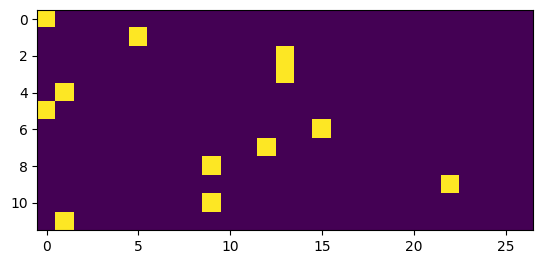

In [9]:
#create training set of all bigrams (x,y)
x,y=[],[]
#loop over each word in dataset. use words[:2] to visualize stuff
for w in words[:2]:
    chs=['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        #get integer representations (indexes) of these characters
        ix1=ctoi[ch1]
        ix2=ctoi[ch2]
        x.append(ix1)
        y.append(ix2)

#convert to tensors. both X and Y will be vectors, with length as number of bigram pairs in training dataset
#note that torch.tensor infers the dtype automatically (can be integer etc) while torch.Tensor returns a torch.FloatTensor
#reccomend using torch.tensor
X=torch.tensor(x)
Y=torch.tensor(y)

import torch.nn.functional as F
#do one hot encoding for this because it doesnt make sense for characters to be integers
#note that here, X_enc.dtype is still int64. Hence we need to convert to Float using .float()
X_enc=F.one_hot(X, num_classes=27).float()
print(X)
plt.imshow(X_enc)

create model, do softmax

In [10]:
#initialise a single neuron, this is a 2D column vector
W=torch.randn((27,1), generator=g)
#@ is the pytorch matmul operator. If X_enc is (n,27) and W is (27,1) then results is (n,1)
X_enc@W

#27 input nodes, also 27 output nodes (neurons)
#now initialise 27 neurons, where the output is (n,27)
#each output neuron corresponds to one class, and one column in the output matrix

W=torch.randn((27,27), generator=g, requires_grad=True)

In [11]:
#do softmax to convert negative numbers into a range of 0 and 1

#we shall train the NN to output the log(counts), as NN will spit out negative and positive numbers
logits=(X_enc@W)
#therefore need to exp(activations) to get the counts
counts=logits.exp()
#then normalize row wise to get probabilities
probs=counts/counts.sum(1, keepdims=True)

#### summary so far

In [12]:
#get the number of examples
num=X.shape[0]
nlls=torch.zeros(num)

#for each bigram pair
for i in range(num):
    x_index=X[i].item()
    y_index=Y[i].item()
    print('='*50)
    print(f'bigram example {i} is {itoc[x_index],itoc[y_index]} with indexes {x_index, y_index}')
    print(f'input to neural net is {x_index}')
    print(f'output probabilities is {probs[i]}')
    print(f'label is {y_index}')
    p=probs[i,y_index]
    print(f'probability assigned by NN to the correct label is{p.item()}')
    print(f'neg-log-likelihood is {-torch.log(p)}')
    
    nlls[i]=-torch.log(p)

print(f'mean negative log likelihood is {nlls.mean()}')

bigram example 0 is ('.', 'e') with indexes (0, 5)
input to neural net is 0
output probabilities is tensor([0.0076, 0.0079, 0.0196, 0.0045, 0.0164, 0.0025, 0.0098, 0.0060, 0.0201,
        0.0092, 0.0137, 0.6149, 0.0391, 0.0107, 0.0138, 0.0124, 0.0078, 0.0182,
        0.0160, 0.0061, 0.0092, 0.0750, 0.0299, 0.0026, 0.0066, 0.0142, 0.0062],
       grad_fn=<SelectBackward0>)
label is 5
probability assigned by NN to the correct label is0.0025312870275229216
neg-log-likelihood is 5.979027271270752
bigram example 1 is ('e', 'm') with indexes (5, 13)
input to neural net is 5
output probabilities is tensor([0.0159, 0.1069, 0.0514, 0.0409, 0.0384, 0.0219, 0.0958, 0.0134, 0.0641,
        0.0253, 0.0519, 0.0485, 0.0491, 0.0268, 0.0138, 0.0480, 0.0061, 0.0161,
        0.0122, 0.0457, 0.0134, 0.0340, 0.0055, 0.0245, 0.0558, 0.0115, 0.0629],
       grad_fn=<SelectBackward0>)
label is 13
probability assigned by NN to the correct label is0.026799943298101425
neg-log-likelihood is 3.6193554401397705
bi

fast way to get loss

In [13]:
loss=-probs[torch.arange(num),Y].log().mean()
loss

tensor(3.7464, grad_fn=<NegBackward0>)

backward pass

In [14]:
#set to zero the gradients, using None is more efficient than zero
W.grad=None
#note that for backwards to work, all elems must be pytorch tensors, cannot be list etc
loss.backward()
W.data +=-0.1*W.grad

#### Full training loop

In [15]:
x,y=[],[]
for w in words:
    chs=['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        ix1=ctoi[ch1]
        ix2=ctoi[ch2]
        x.append(ix1)
        y.append(ix2)

X=torch.tensor(x)
Y=torch.tensor(y)

num=X.shape[0]

#initialize network
W=torch.randn((27,27),generator=g,requires_grad=True)

#encode inputs
X_enc=F.one_hot(X, num_classes=27).float()

#### regularization

note that if W is all 0, then logits become all 0, then logits.exp() becomes all 1, then becomes uniform distribution
so regularization is like uniform dist
This also applies if all the W are equal, low variance

want to bring W to zero as possible - penalizing large values

stregnth of regularization is basically how many counts you add

In [16]:
#all of X_enc,logits,probs have shape of (n,27)

#gradient descent
for e in range(2000):
    #forward pass
    logits=X_enc@W #predict log(counts)
    counts=logits.exp()
    probs=counts/counts.sum(1, keepdims=True)

    #regularization
    L2=0.00001*(W**2).sum()

    #take the log-prob of the correct labels only. want to minimize this nll towards zero, maximize the probs for the correct label towards 1
    # probs is the output prediction, not the probability dataset!
    #we reward the good predictions here, but dont penalise the bad decisions?
    loss= (-probs[torch.arange(num),Y].log().mean()) + L2
    print('loss is',loss.item())

    #backward pass
    W.grad=None
    loss.backward()

    #update
    W.data+= -3*W.grad

loss is 3.819507122039795
loss is 3.793354034423828
loss is 3.7680373191833496
loss is 3.7434933185577393
loss is 3.7196648120880127
loss is 3.6965036392211914
loss is 3.6739673614501953
loss is 3.6520187854766846
loss is 3.6306238174438477
loss is 3.6097545623779297
loss is 3.5893845558166504
loss is 3.5694916248321533
loss is 3.5500552654266357
loss is 3.5310580730438232
loss is 3.512484312057495
loss is 3.4943206310272217
loss is 3.476553440093994
loss is 3.4591732025146484
loss is 3.442168951034546
loss is 3.425532817840576
loss is 3.409257411956787
loss is 3.3933346271514893
loss is 3.3777592182159424
loss is 3.3625242710113525
loss is 3.347625255584717
loss is 3.333056926727295
loss is 3.318814754486084
loss is 3.304893970489502
loss is 3.291290521621704
loss is 3.2779996395111084
loss is 3.265016794204712
loss is 3.2523388862609863
loss is 3.239959478378296
loss is 3.2278757095336914
loss is 3.216080904006958
loss is 3.20457124710083
loss is 3.1933414936065674
loss is 3.18238496

#### some extra notes
- the "ideal" loss we expect to get is the average neg-log-likelihood of that whole probability dataset, which is around 2.45! which is what we see... thats actually insane
    - I dont this is true only if you dont include the L2 term
- note nll is summed over the probs of the "correct label" only. Why is it the same? The NN be maximizing such that each probability for the true label goes to 1. Yet the fact that the nll is the same means that somehow maximizing means it goes to 0.8 if the true probability is 0.8 for e.g.
    - this is because probs is the predicted one-hot-encoded Y, and you are indeed maximizing towards 1 only for the correct labels
    - probs is not the probability dataset, W is!
- note that 'logits=X_enc@W' means that only the weight for the input label actually matters, as due to one-hot-encoding, all other columns are 0, only the relevant input column is 1
- so one-hot really means to select the relevant neuron (each row in the W matrix) associated with the input.
- so training loss basically nudges the neurons towards that true label example by example

- HOLY FUCKING SHIT THE W MATRIX ACTUALLY APPROXIMATES THE PROABILITY DIST LOOK AT THE VISUALIZATION BELOW
- To be more accurate, W is the logits, the log(counts), so need to exponentiate it and normalize

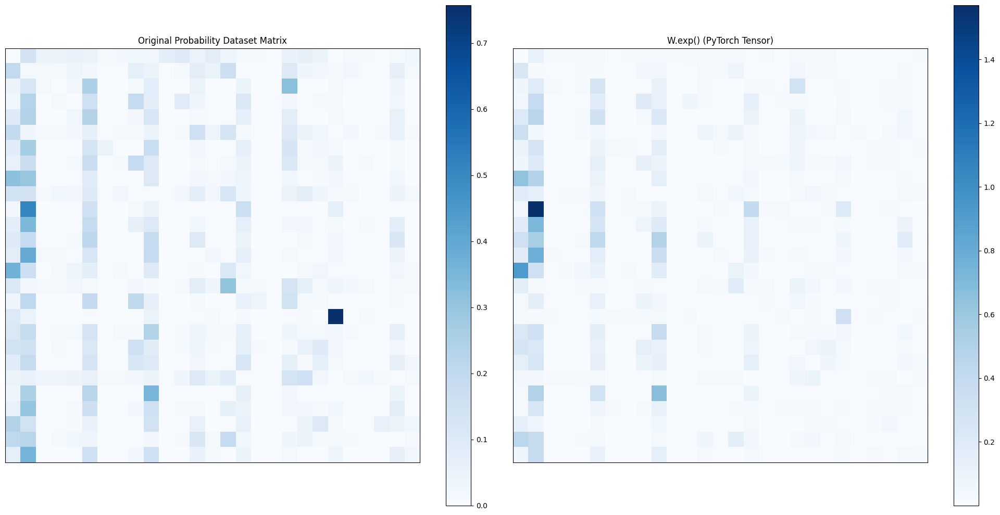

In [18]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Normalize N row-wise
N = N/N.sum(axis=1, keepdims=True)

# Plot N
im1 = ax1.imshow(N, cmap='Blues')
ax1.set_title('Original Probability Dataset Matrix')
fig.colorbar(im1, ax=ax1)

# Plot W (PyTorch tensor)
W_exp=W.exp()
W_prob=W_exp/W_exp.sum(dim=1)

im2 = ax2.imshow(W_prob.cpu().detach().numpy(), cmap='Blues')
ax2.set_title('W.exp() (PyTorch Tensor)')
fig.colorbar(im2, ax=ax2)

# Remove axis ticks for cleaner look
for ax in (ax1, ax2):
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

sampling

In [19]:
#for loop to sample words multiple times'
for sample in range(10):
    #start from '.' token hence first idx 0
    idx=0
    out=[]
    while True:
        #get one hot for this charac
        x_charac_enc=F.one_hot(torch.tensor([idx]),num_classes=27).float()
        logits = x_charac_enc@W #predict log-counts
        counts=logits.exp()
        p=counts/counts.sum(dim=1,keepdims=True)

        #samples from this distribution. replacement=False means it can only sample from that column once. need .item() to extract the number, else it will return a tensor object
        idx = torch.multinomial(row, num_samples=1, replacement=True, generator=g).item()
        #add to current list
        out.append(itoc[idx])
        #have reached the <E> token basically
        if idx==0:
            break
    print(''.join(out))

hhtatmataseeheeiasaoait.
tuaai.
ahhaahao.
yhihvtoetehhbihec.
a.
s.
.
hoos.
soua.
hseoieuaaithaaal.
